In [6]:
import matplotlib.pyplot as plt
%matplotlib inline

import os
from glob import glob

import cv2

In [7]:
def read_image(path):
    image = cv2.imread(path, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

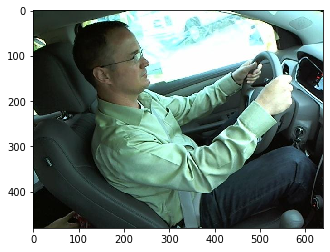

In [8]:
data_dir = 'C:/Users/TGNOTE/Desktop/state-farm-distracted-driver-detection/'
train_path = data_dir + 'imgs/train/c0/'
test_path = data_dir + 'imgs/test/'
filename = 'img_208.jpg'

image = read_image(train_path + filename)

plt.imshow(image)

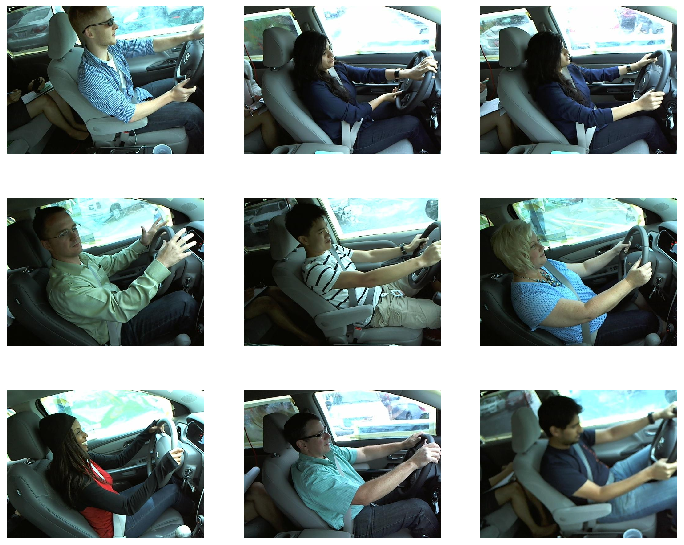

				# c0 : 안전 운전


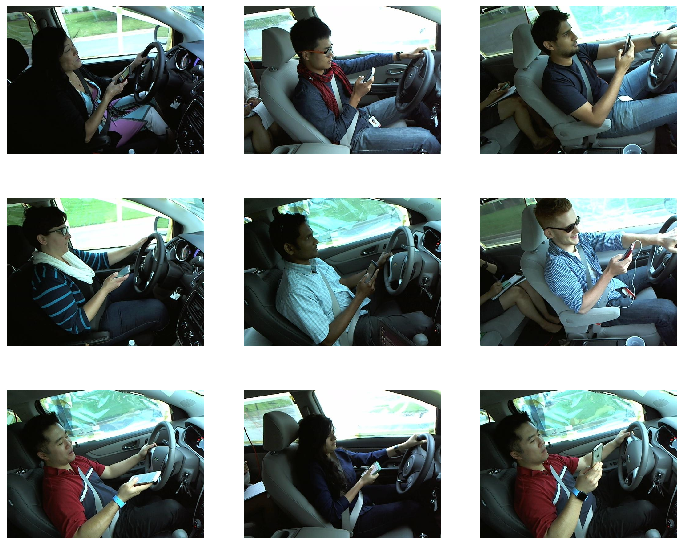

				# c1 : 오른손으로 문자


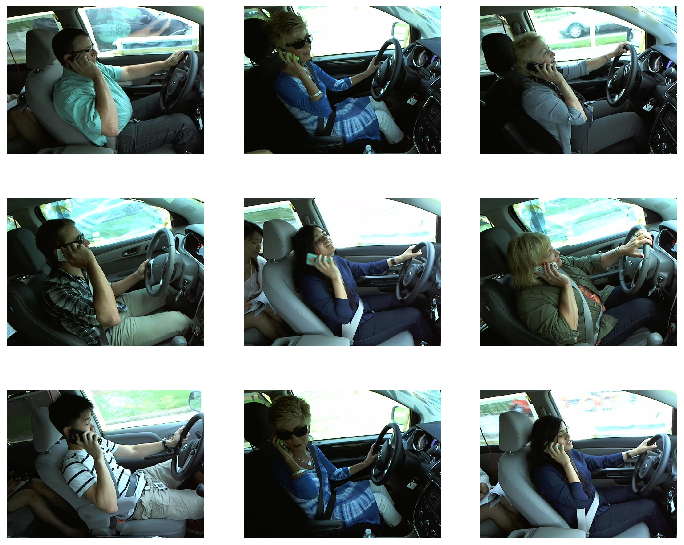

				# c2 : 오른손으로 전화


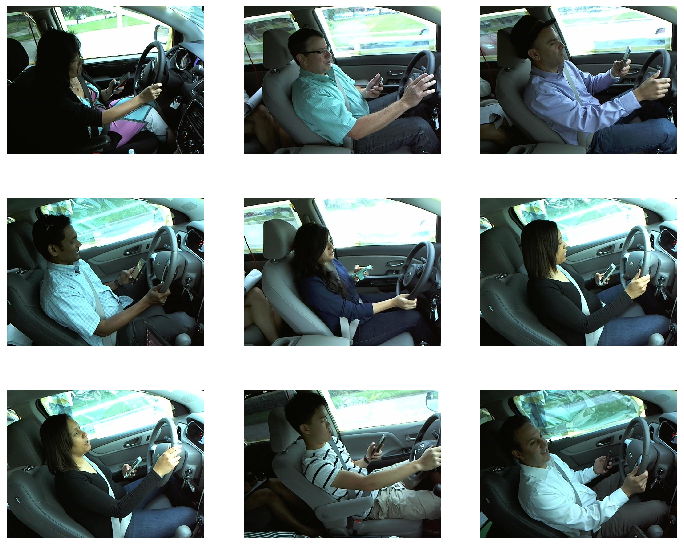

				# c3 : 왼손으로 문자


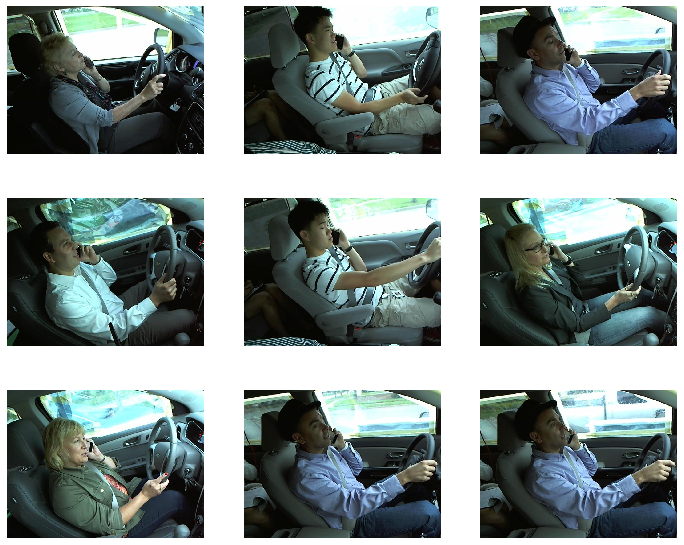

				# c4 : 왼손으로 전화


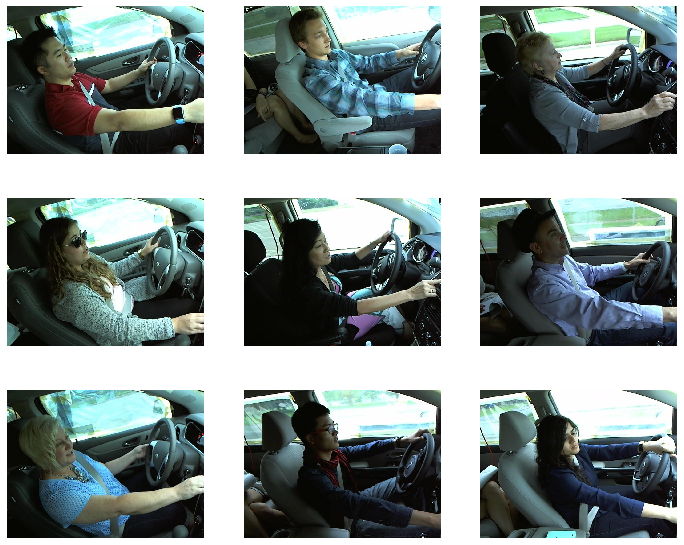

				# c5 : 라디오 조작


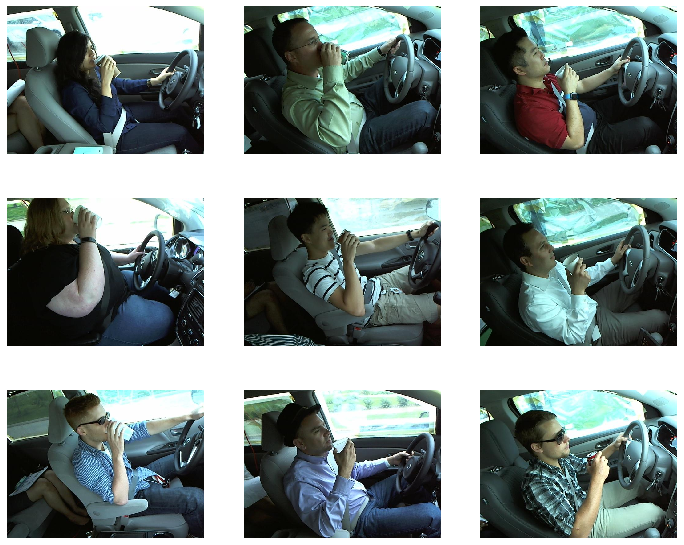

				# c6 : 음료수 섭취


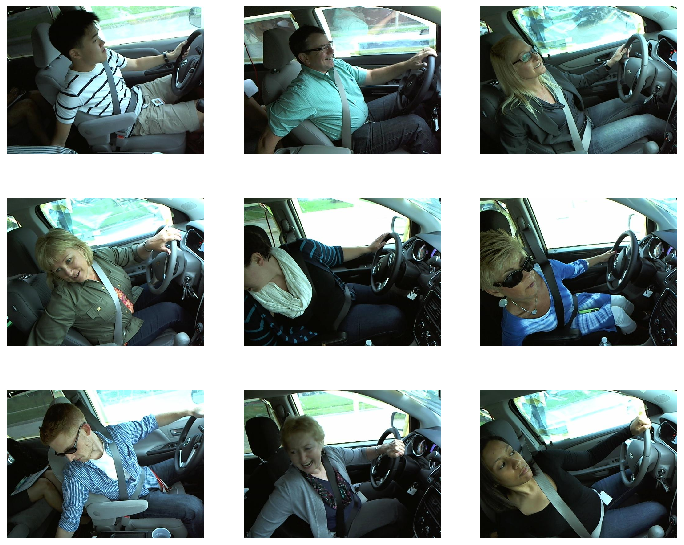

				# c7 : 뒷자석에 손 뻗기


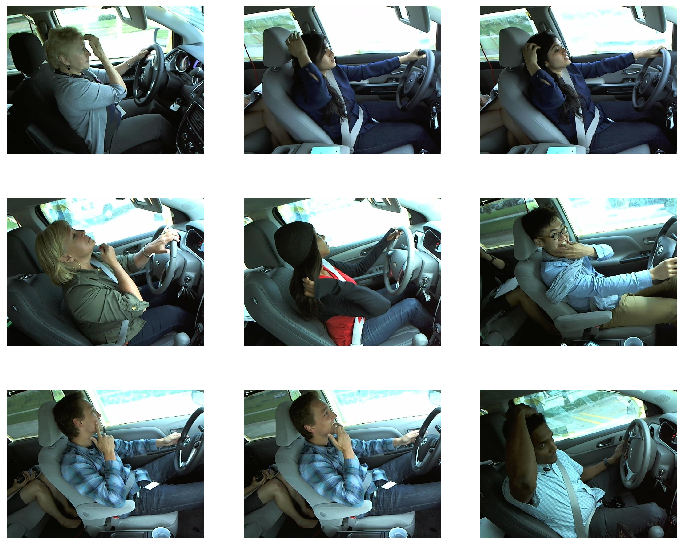

				# c8 : 얼굴, 머리 만지기


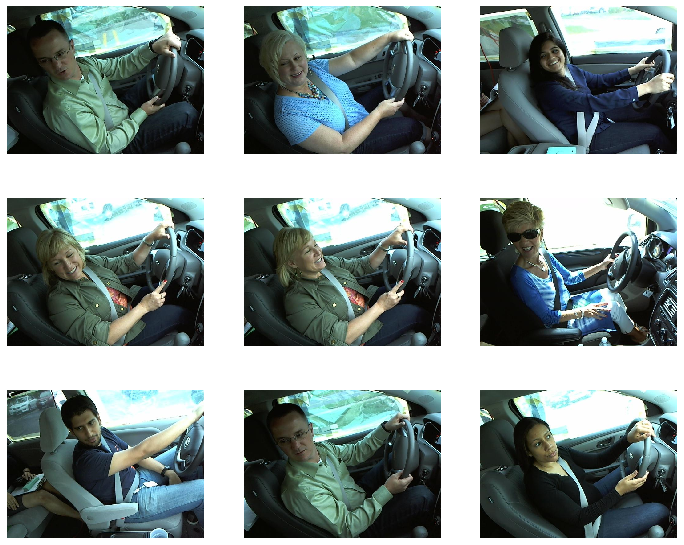

				# c9 : 조수석과 대화


In [9]:
labels = ['c0','c1','c2','c3','c4','c5','c6','c7','c8','c9']
col_to_kor = {
    'c0' : '안전 운전',
    'c1' : '오른손으로 문자',
    'c2' : '오른손으로 전화',
    'c3' : '왼손으로 문자',
    'c4' : '왼손으로 전화',
    'c5' : '라디오 조작',
    'c6' : '음료수 섭취',
    'c7' : '뒷자석에 손 뻗기',
    'c8' : '얼굴, 머리 만지기',
    'c9' : '조수석과 대화',
}
for label in labels:
    f, ax = plt.subplots(figsize=(12,10))
    files = glob('{}/imgs/train/{}/*.jpg'.format(data_dir, label))
    
    for x in range(9):
        plt.subplot(3, 3, x+1)
        image = read_image(files[x])
        plt.imshow(image)
        plt.axis('off')
    plt.show()
    print('\t\t\t\t# {} : {}'.format(label, col_to_kor[label]))

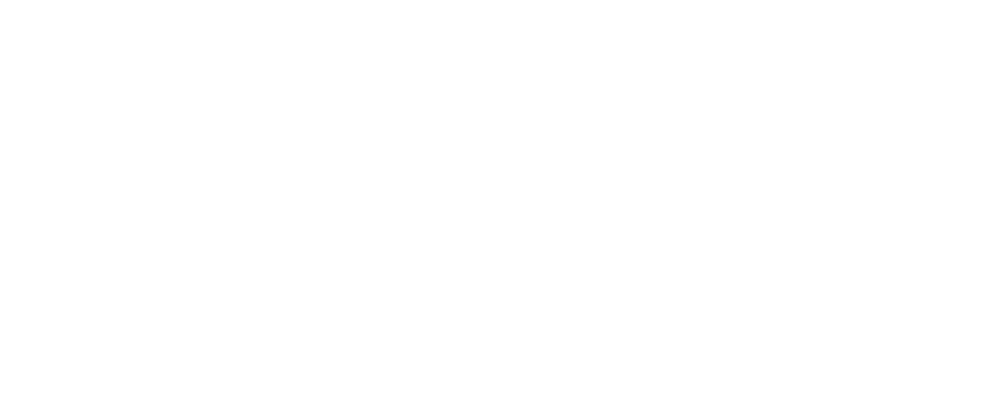

In [10]:
f, ax = plt.subplots(figsize=(24,10))
files = glob('{}/imgs/test/*.jpg'.format(data_dir))

for x in range(18):
    plt.subplot(3,6, x+1)
    image = read_image(files[x])
    plt.axis('off')

In [11]:
import pandas as pd

driver_list = pd.read_csv('C:/Users/TGNOTE/Desktop/state-farm-distracted-driver-detection/driver_imgs_list.csv')

driver_list.head()

,subject,classname,img
0,p002,c0,img_44733.jpg
1,p002,c0,img_72999.jpg
2,p002,c0,img_25094.jpg
3,p002,c0,img_69092.jpg
4,p002,c0,img_92629.jpg


In [12]:
import numpy as np

len(np.unique(driver_list['subject']).tolist())

26

In [13]:
driver_to_img={}
for i, row in driver_list.iterrows():
    driver = row['subject']
    label = row['classname']
    image_path = row['img']
    if not driver_to_img.get(driver, False):
        driver_to_img[driver] = [image_path]
    else:
        driver_to_img.get(driver).append(image_path)

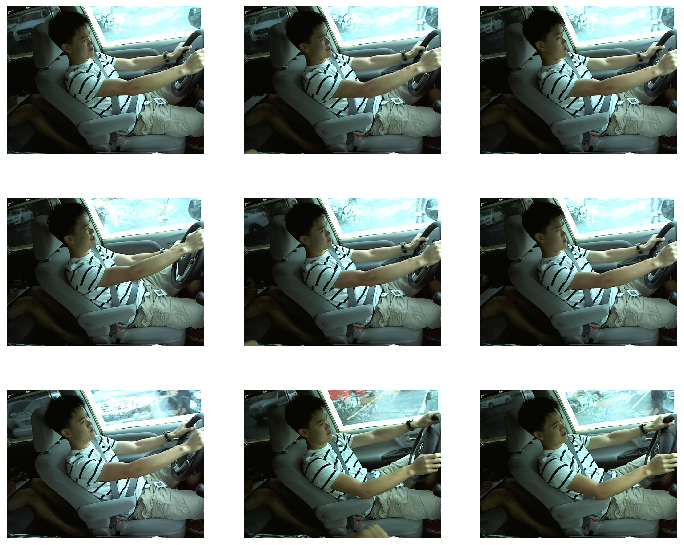

				# 운전자 : p002 | 클래스 : "c0 : 안전 운전"


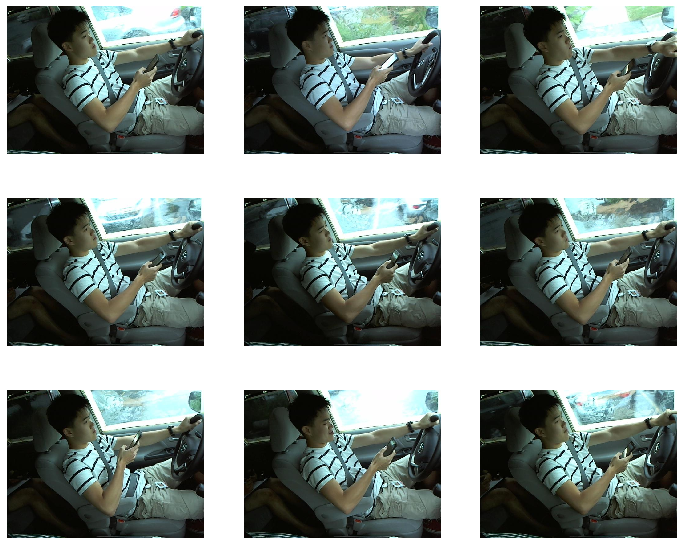

				# 운전자 : p002 | 클래스 : "c1 : 오른손으로 문자"


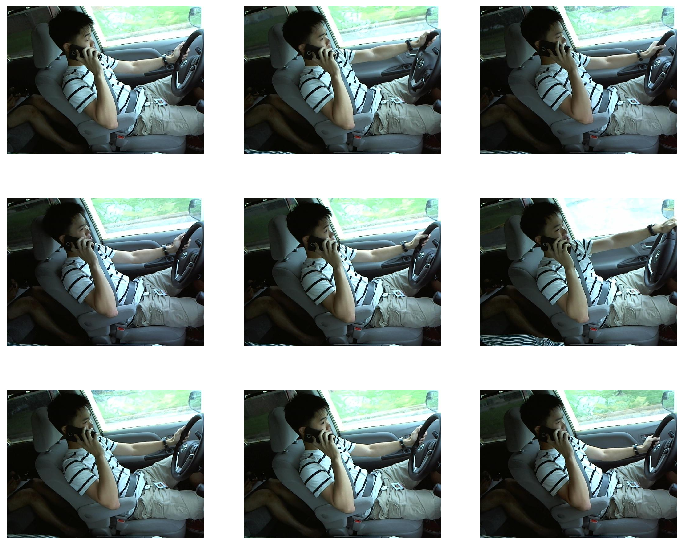

				# 운전자 : p002 | 클래스 : "c2 : 오른손으로 전화"


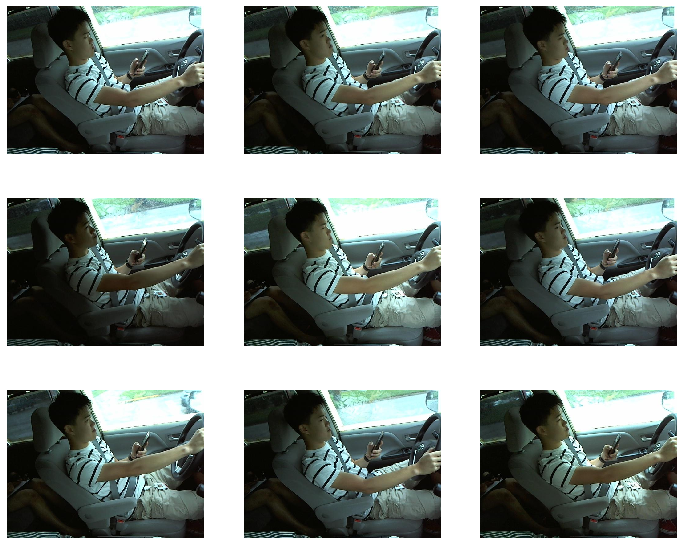

				# 운전자 : p002 | 클래스 : "c3 : 왼손으로 문자"


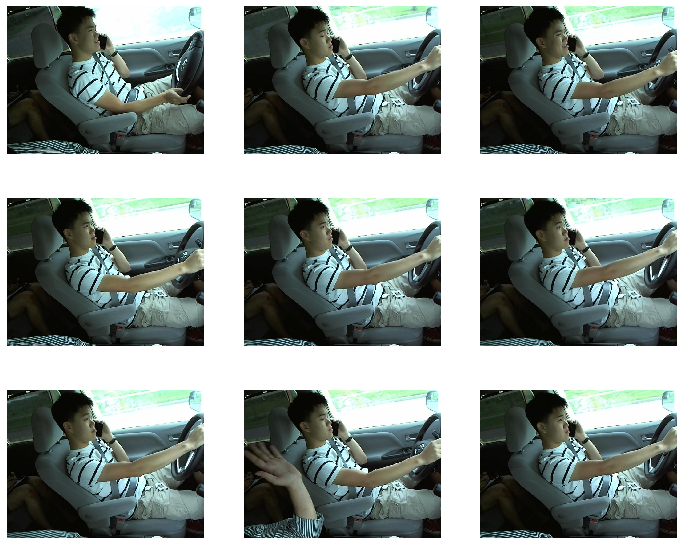

				# 운전자 : p002 | 클래스 : "c4 : 왼손으로 전화"


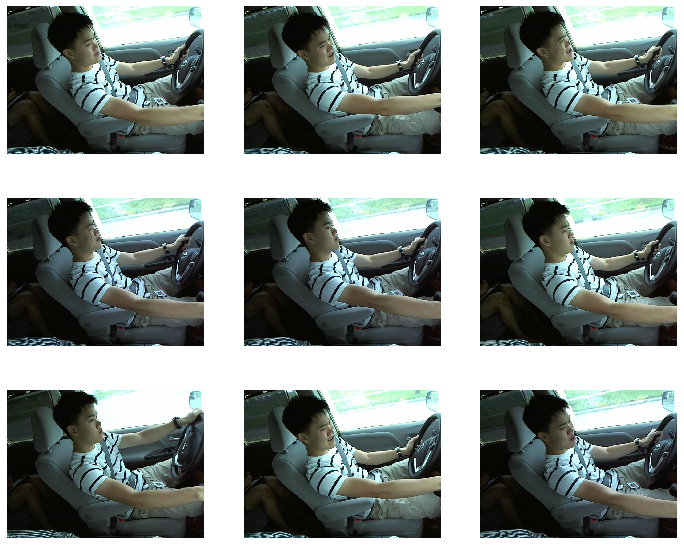

				# 운전자 : p002 | 클래스 : "c5 : 라디오 조작"


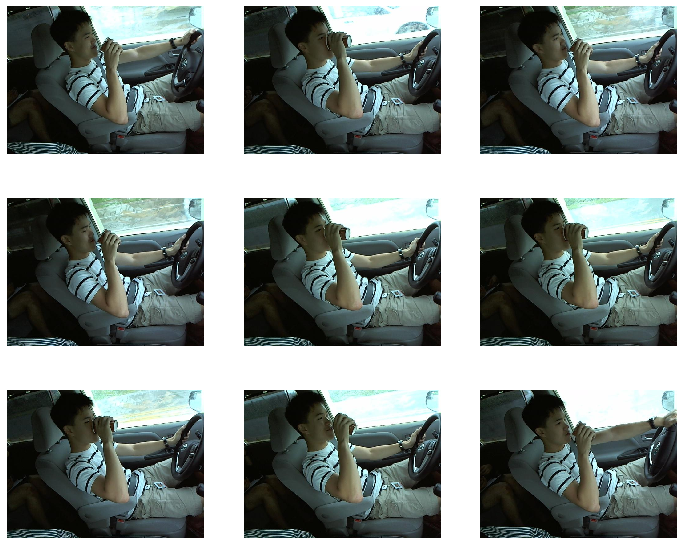

				# 운전자 : p002 | 클래스 : "c6 : 음료수 섭취"


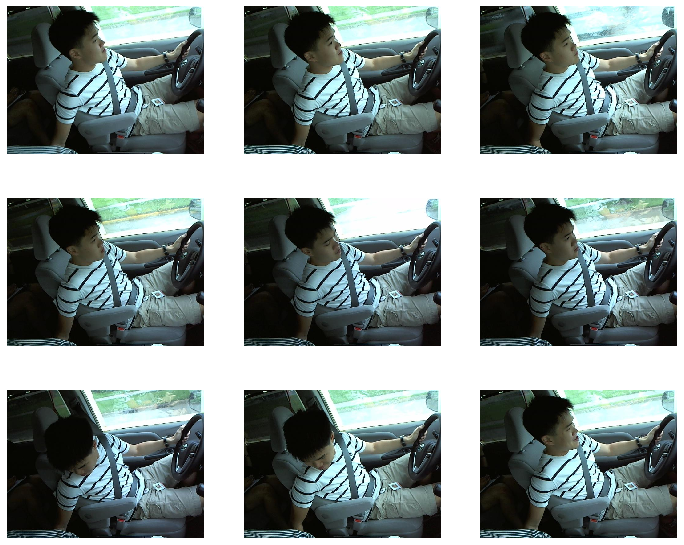

				# 운전자 : p002 | 클래스 : "c7 : 뒷자석에 손 뻗기"


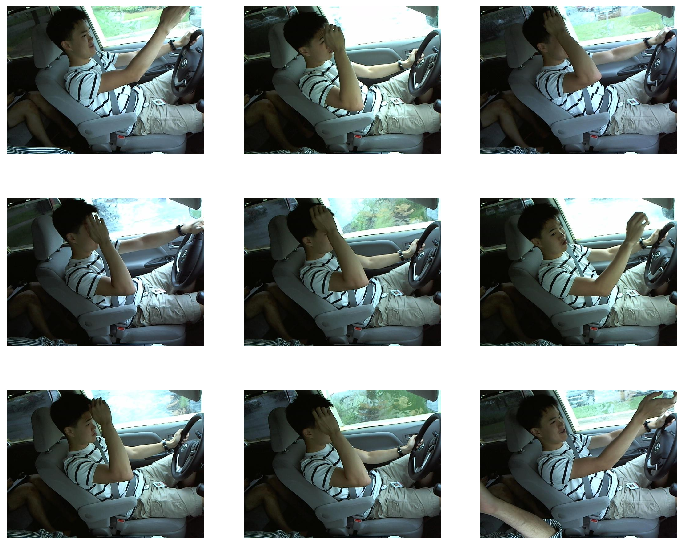

				# 운전자 : p002 | 클래스 : "c8 : 얼굴, 머리 만지기"


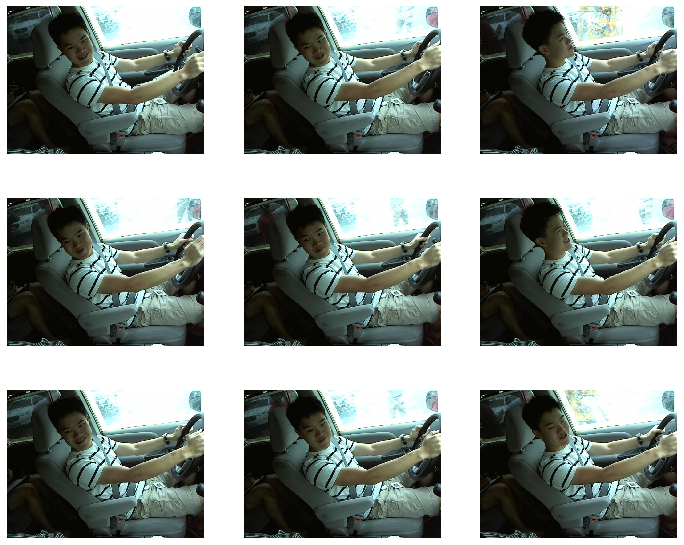

				# 운전자 : p002 | 클래스 : "c9 : 조수석과 대화"


In [14]:
for driver in np.unique(driver_list['subject']).tolist():
    for label in labels:
        f, ax = plt.subplots(figsize=(12,10))
        files = glob('{}/imgs/train/{}/*.jpg'.format(data_dir, label))
        print_files = []
        for fl in files:
            if(driver_list[driver_list['img'] == os.path.basename(fl)]['subject']==driver).values[0]:
                print_files.append(fl)
                
        for x in range(9):
            plt.subplot(3,3,x+1)
            image = read_image(print_files[x])
            plt.imshow(image)
            plt.axis('off')
        plt.show()
        
        print('\t\t\t\t# 운전자 : {} | 클래스 : "{} : {}"'.format(driver, label, col_to_kor[label]))
        
    break

# "c0 : 안전 운전" Outliers


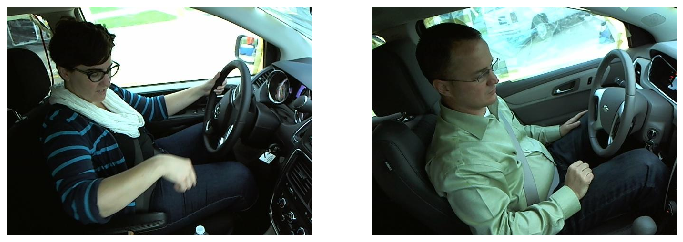

#"c3 : 왼손으로 문자" Outliers


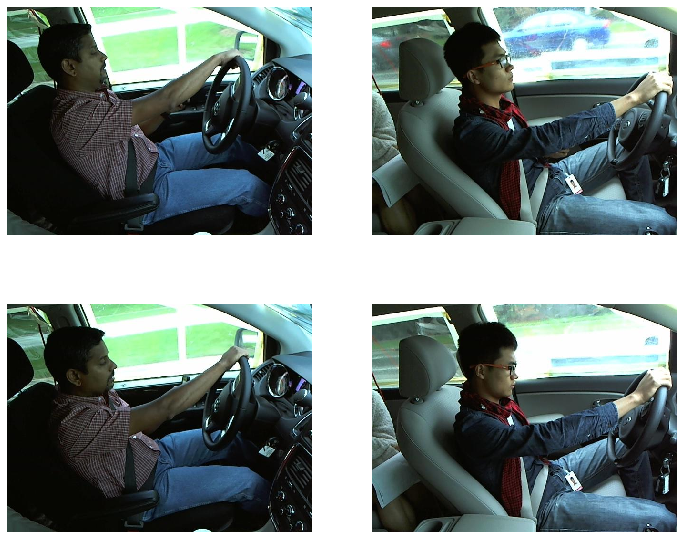

#"c4 : 왼손으로 전화" Outliers


error: OpenCV(4.2.0) C:\projects\opencv-python\opencv\modules\imgproc\src\color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


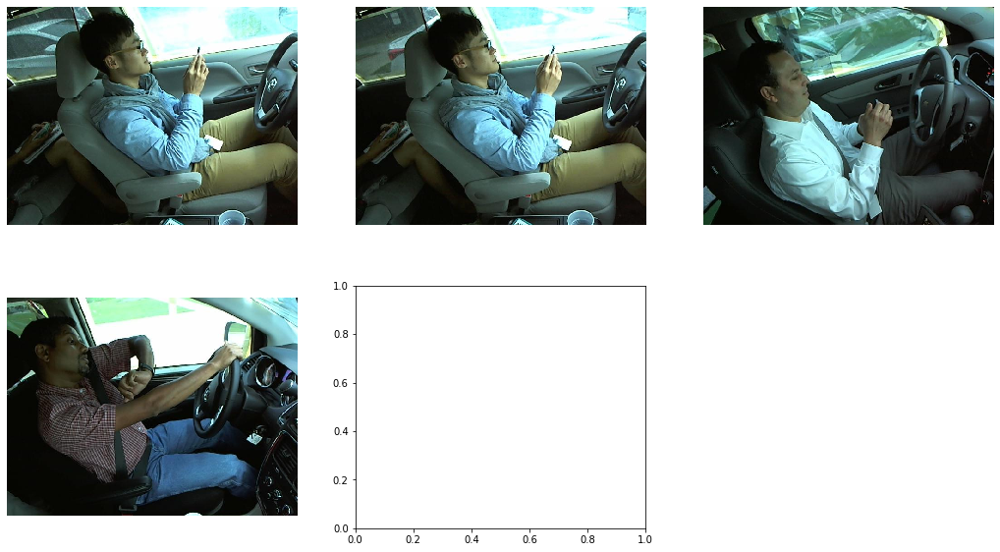

In [16]:
label = 'c0'
imgs = [21155,31121]
print('# "c0 : 안전 운전" Outliers')
f, ax = plt.subplots(figsize=(12,10))
for x in range(len(imgs)):
    plt.subplot(1,2,x+1)
    image = read_image('{}/imgs/train/{}/img_{}.jpg'.format(data_dir, label, imgs[x]))
    plt.imshow(image)
    plt.axis('off')
plt.show()

label = 'c3'
imgs = [38563,45874,49269,62784]
print('#"c3 : 왼손으로 문자" Outliers')
f, ax = plt.subplots(figsize=(12,10))
for x in range(len(imgs)):
    plt.subplot(2,2,x+1)
    image = read_image('{}/imgs/train/{}/img_{}.jpg'.format(data_dir, label, imgs[x]))
    plt.imshow(image)
    plt.axis('off')
plt.show()

label = 'c4'
imgs = [92769, 38427, 41743, 69998, 73347, 16077]
print('#"c4 : 왼손으로 전화" Outliers')
f, ax = plt.subplots(figsize=(18,10))
for x in range(len(imgs)):
    plt.subplot(2,3,x+1)
    image = read_image('{}/imgs/train/{}/img_{}.jpg'.format(data_dir, label, imgs[x]))
    plt.imshow(image)
    plt.axis('off')
plt.show()

label = 'c9'
imgs = [28068, 37708, 73663]
print('# "c9: 조수석과 대화" Outliers')
f, ax = plt.subplots(figsize=(18, 10))
for x in range(len(imgs)):
    plt.subplot(1, 3, x+1)
    image = read_image('{}/imgs/train/{}/img_{}.jpg'.format(data_dir, label, imgs[x]))
    plt.imshow(image)
    plt.axis('off')
plt.show()

# Examples of c0 : 안전운전 classified in wrong labels


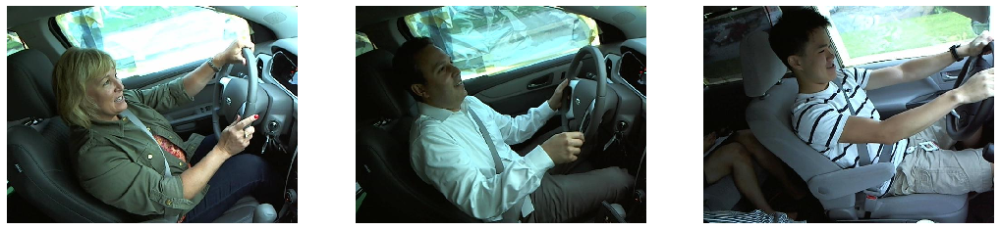

# Examples of c1 : 오른손으로 문자 classified in wrong labels


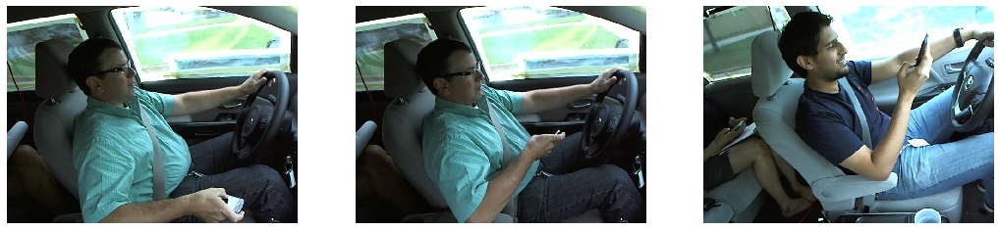

# Examples of c8 : 얼굴, 머리 만지기 classified in wrong labels


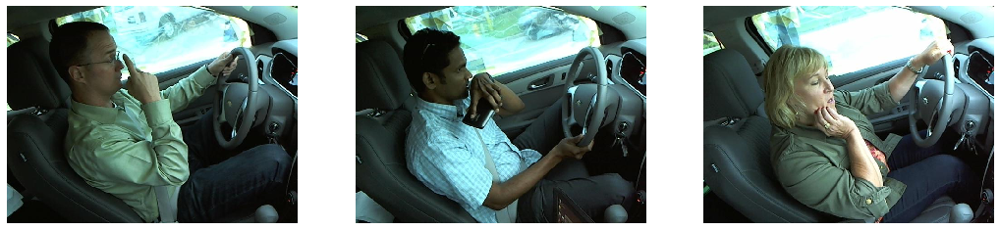

In [18]:
# 잘못 분류된 훈련 데이터의 일부를 시각화한다

# Real Label : c0
imgs = [('c5', 30288), ('c7', 46617), ('c8', 3835)]
f, ax = plt.subplots(figsize=(18, 10))
print('# Examples of c0 : 안전운전 classified in wrong labels')
for x in range(len(imgs)):
    plt.subplot(1, 3, x+1)
    image = read_image('{}/imgs/train/{}/img_{}.jpg'.format(data_dir, imgs[x][0], imgs[x][1]))
    plt.imshow(image)
    plt.axis('off')
plt.show()

# Real Label : c1
imgs = [('c0', 29923), ('c0', 79819), ('c2', 32934)]
f, ax = plt.subplots(figsize=(18, 10))
print('# Examples of c1 : 오른손으로 문자 classified in wrong labels')
for x in range(len(imgs)):
    plt.subplot(1, 3, x+1)
    image = read_image('{}/imgs/train/{}/img_{}.jpg'.format(data_dir, imgs[x][0], imgs[x][1]))
    plt.imshow(image)
    plt.axis('off')
plt.show()

# Real Label : c8
imgs = [('c0', 34380), ('c3', 423), ('c5', 78504)]
f, ax = plt.subplots(figsize=(18, 10))
print('# Examples of c8 : 얼굴, 머리 만지기 classified in wrong labels')
for x in range(len(imgs)):
    plt.subplot(1, 3, x+1)
    image = read_image('{}/imgs/train/{}/img_{}.jpg'.format(data_dir, imgs[x][0], imgs[x][1]))
    plt.imshow(image)
    plt.axis('off')
plt.show()

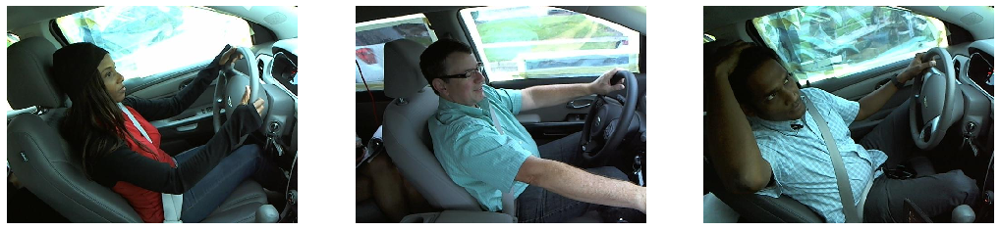

In [20]:
# 이미지 파일 경로를 지정한다
data_dir = 'C:/Users/TGNOTE/Desktop/state-farm-distracted-driver-detection/'
img_path = [('c0', 55301), ('c5', 92551), ('c8', 71055)]

# 이미지를 그대로 읽어온다
imgs = []
for x in range(len(img_path)):
    imgs.append(read_image('{}/imgs/train/{}/img_{}.jpg'.format(data_dir, img_path[x][0], img_path[x][1])) / 255.)

# 이미지를 시각화한다
f, ax = plt.subplots(figsize=(18, 10))
for i, img in enumerate(imgs):
    plt.subplot(1, 3, i+1)
    plt.imshow(img)
    plt.axis('off')
plt.show()

# 이미지 회전 : -10도


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


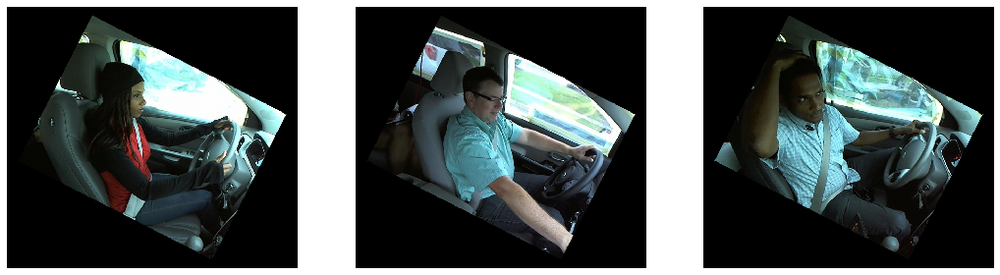

In [22]:
from scipy.ndimage import rotate

# 임의의 회전 각도을 구한 후, 이미지를 회전한다.
rotate_angle = np.random.randint(40) - 20
print('# 이미지 회전 : {}도'.format(rotate_angle))
for i, img in enumerate(imgs):
    imgs[i] = rotate(img, rotate_angle)

# 이미지를 시각화한다.
f, ax = plt.subplots(figsize=(18, 10))
for x, img in enumerate(imgs):
    plt.subplot(1, 3, x+1)
    plt.imshow(img)
    plt.axis('off')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


# 이미지 줌 인 : (x : 0.88, y : 0.83)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


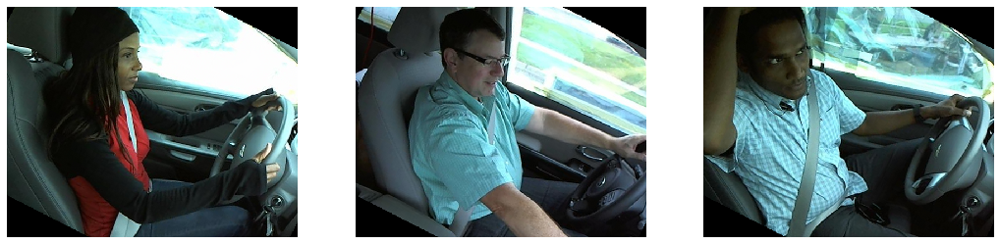

In [23]:
def crop_center(img, cropx, cropy):
    # 이미지 중간을 Crop하는 함수를 정의한다
    y,x = img.shape
    startx = x//2-(cropx//2)
    starty = y//2-(cropy//2)    
    return img[starty:starty+cropy,startx:startx+cropx]

# x,y 축의 이미지 확대 비율을 랜덤으로 정의한다
width_zoom = int(image.shape[0] * (0.8 + 0.2 * (1 - np.random.random())))
height_zoom = int(image.shape[1] * (0.8 + 0.2 * (1 - np.random.random())))

# 이미지를 확대한다
print('# 이미지 줌 인 : (x : {}, y : {})'.format(round(1. * width_zoom / image.shape[0], 2), \
                                            round(1. *height_zoom / image.shape[1],2 )))
for i, img in enumerate(imgs):
    final_image = np.zeros((width_zoom, height_zoom, 3))
    final_image[:,:,0] = crop_center(img[:,:,0], height_zoom, width_zoom)
    final_image[:,:,1] = crop_center(img[:,:,1], height_zoom, width_zoom)
    final_image[:,:,2] = crop_center(img[:,:,2], height_zoom, width_zoom)
    imgs[i] = final_image

# 이미지를 시각화한다
f, ax = plt.subplots(figsize=(18, 10))
for x, img in enumerate(imgs):
    plt.subplot(1, 3, x+1)
    plt.imshow(img)
    plt.axis('off')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10x10 커널 크기로 이미지 흐리기


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


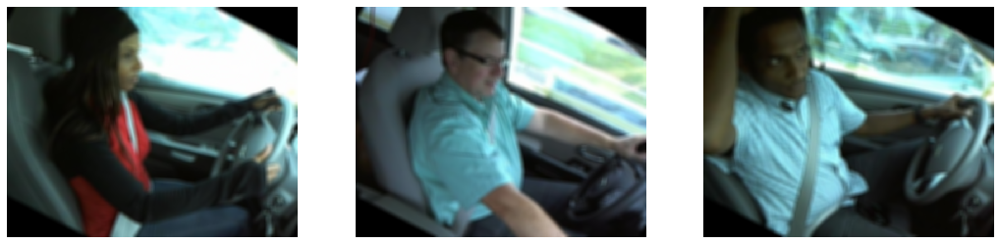

In [24]:
# 10x10 크기의 커널로 이미지를 흐린다
blur_degree = 10
print('{}x{} 커널 크기로 이미지 흐리기'.format(blur_degree, blur_degree))
for i, img in enumerate(imgs):
    imgs[i] = cv2.blur(img,(blur_degree,blur_degree))

# 이미지를 시각화한다
f, ax = plt.subplots(figsize=(18, 10))
for x, img in enumerate(imgs):
    plt.subplot(1, 3, x+1)
    plt.imshow(img)
    plt.axis('off')
plt.show()